In [1]:
import pandas as pd
import numpy as np
import os
os.environ['PROJ_LIB'] = r''
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap
import mplcursors
import mpld3
import datetime
from random import randint
import matplotlib.backends.backend_pdf

# PARAMETERS

In [2]:
keep_only_every_nth_row = 5
time_diff_between_routes = datetime.timedelta(days=0, seconds=0, microseconds=0, milliseconds=0, minutes=0, hours=4, weeks=0)

In [3]:
df = pd.read_csv("percorsoMezzi.csv")

In [4]:
df["DataOraAcquisizione"] = pd.to_datetime(df["DataOraAcquisizione"])

In [5]:
df = df.iloc[::keep_only_every_nth_row, :]

In [6]:
print(f"Average number of points per mezzo: {df.groupby(by=['IdMezzo']).count()['DataOraAcquisizione'].mean()}")

Average number of points per mezzo: 44479.90789473684


In [7]:
dfs = dict(tuple(df.groupby('IdMezzo')))

In [2]:
dfs["56fa8952-64ed-e711-80be-0050569357e4"]

NameError: name 'dfs' is not defined

In [9]:
my_list = []
for mezzo in dfs.keys():
    my_diff = dfs[mezzo]["DataOraAcquisizione"].diff()
    my_list.append((mezzo, my_diff.max(), my_diff.min(), my_diff.mean()))

In [3]:
my_list

NameError: name 'my_list' is not defined

In [11]:
print(f"Maximum distance between 2 successive points for a truck: {max(my_list,key=lambda item:item[1])[1]}")

Maximum distance between 2 successive points for a truck: 83 days 18:28:42


In [12]:
print(f"Minimum distance between 2 successive points for a truck: {min(my_list,key=lambda item:item[1])[2]}")

Minimum distance between 2 successive points for a truck: 0 days 00:00:05


In [13]:
print(f"Average distance between 2 successive points for a truck: {np.mean([x[3] for x in my_list])}")

Average distance between 2 successive points for a truck: 0 days 00:16:30.412411113


In [1]:
my_list2 = []
for el in dfs.keys():
    my_list2.append((el, len(dfs[el])))
sorted(my_list2, key=lambda tup: tup[1])

NameError: name 'dfs' is not defined

In [15]:
my_mezzo = '7a6bab76-67af-e711-80be-0050569357e4'

In [16]:
intervals = {}
for key in dfs.keys():
    dfs[key]["distance"] = dfs[key]["DataOraAcquisizione"].diff()
    interval = dfs[key][dfs[key]["distance"] > time_diff_between_routes]["DataOraAcquisizione"].tolist()
    intervals[key] = [(np.datetime64('2000-01-01T00:00:00'),'black')]
    for el in interval:
        intervals[key].append((np.datetime64(el),'#%06X' % randint(0, 0xFFFFFF)))

In [17]:
#%pylab

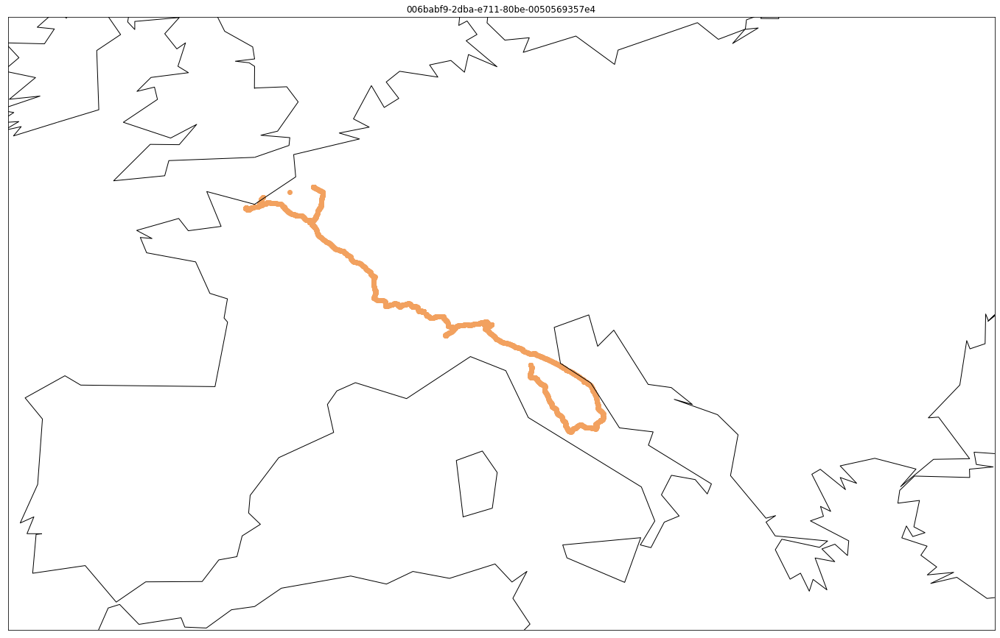

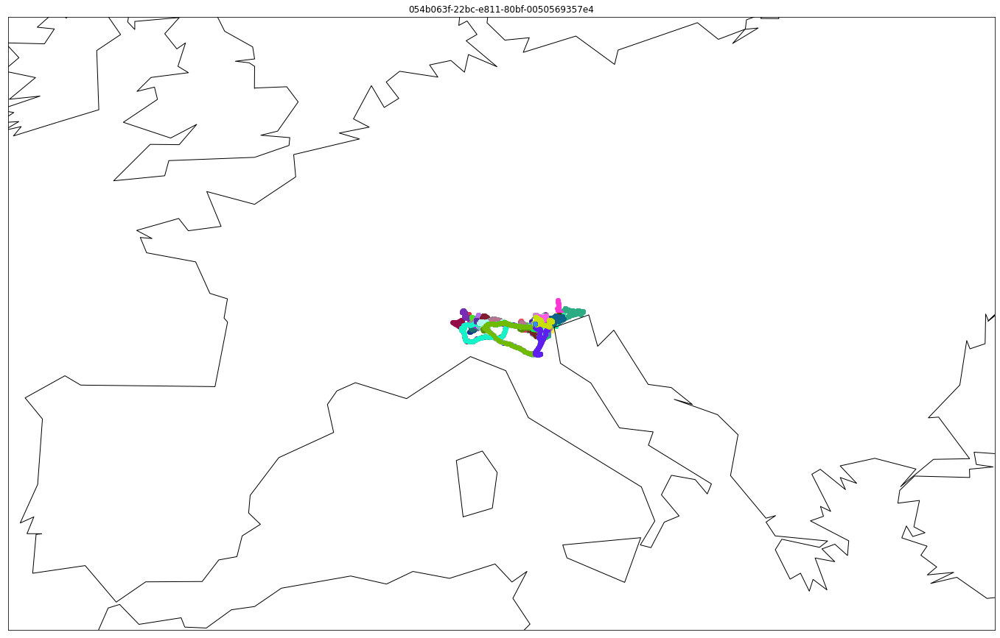

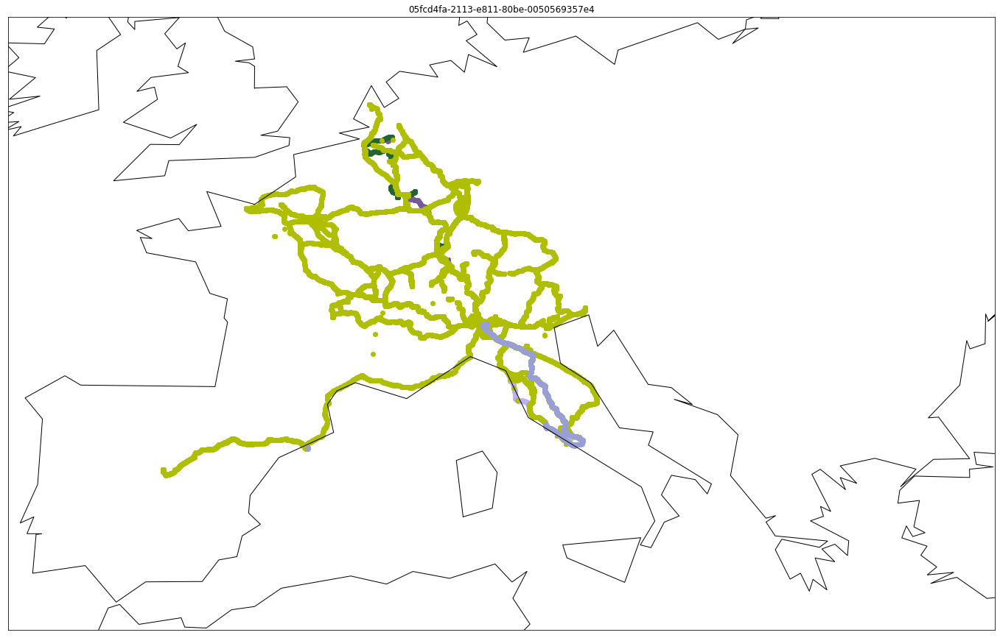

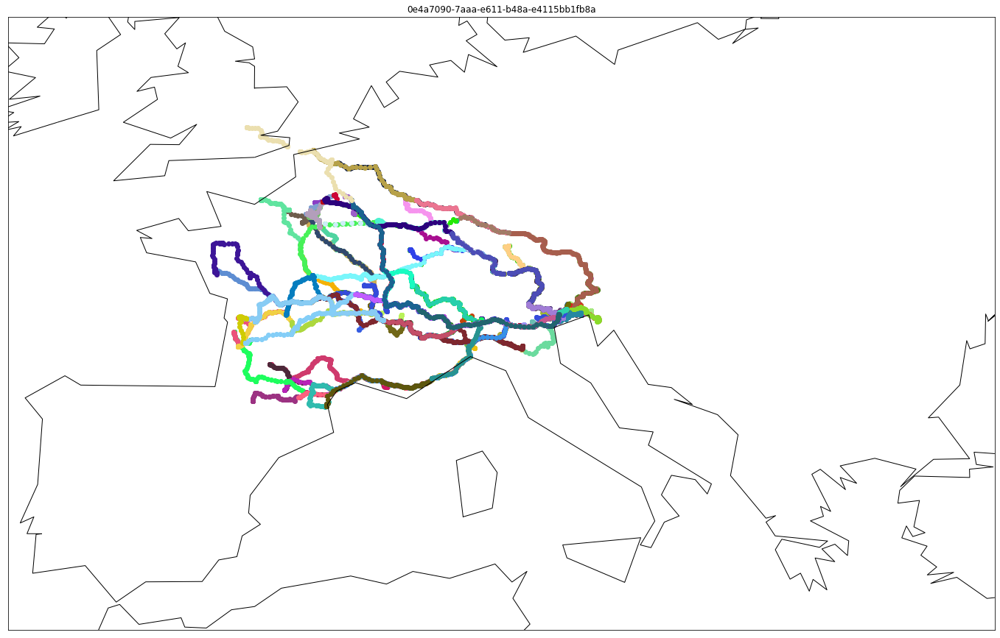

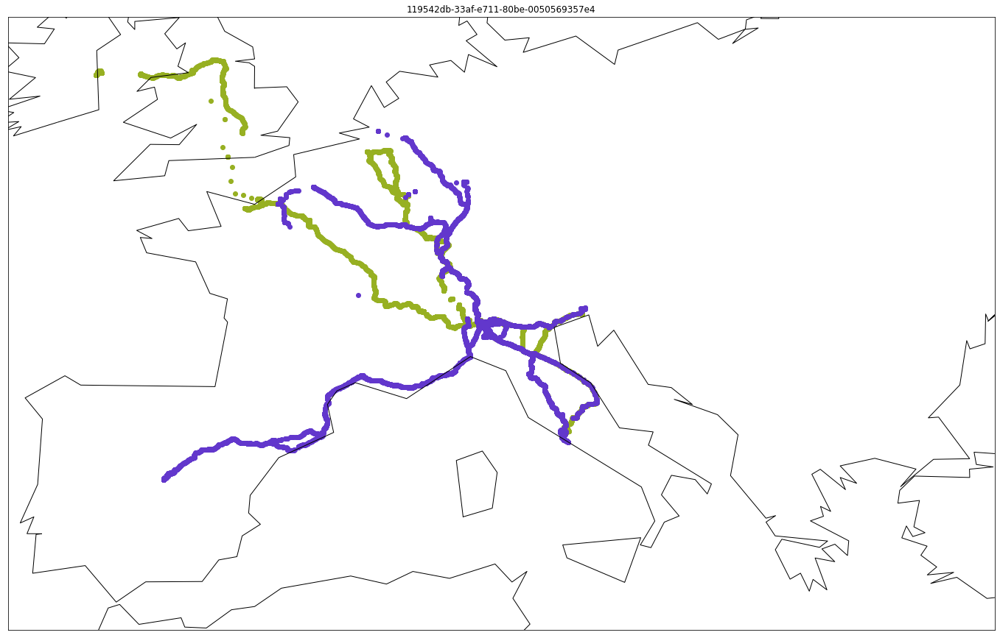

...

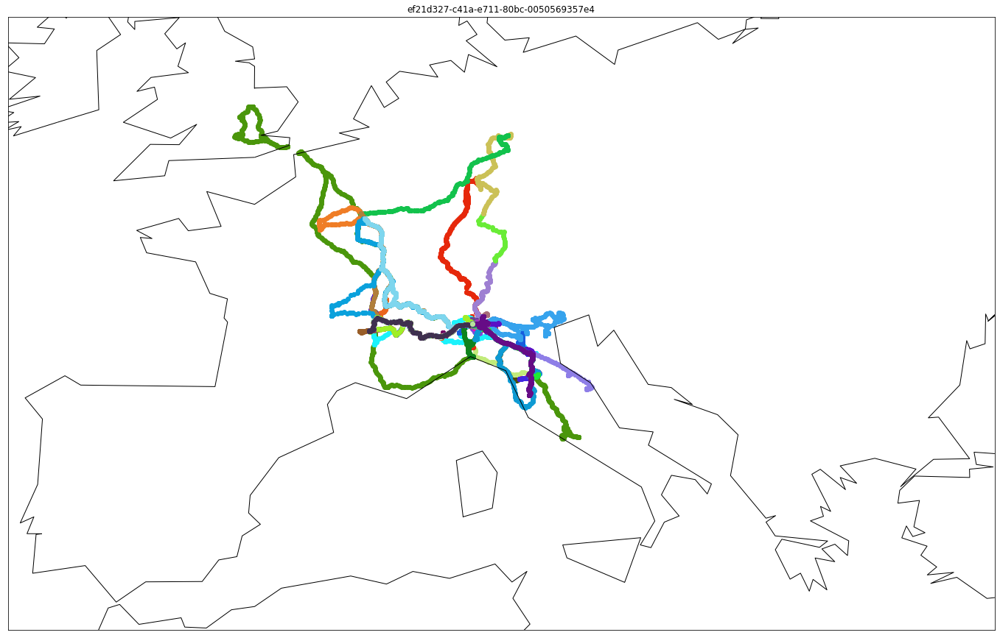

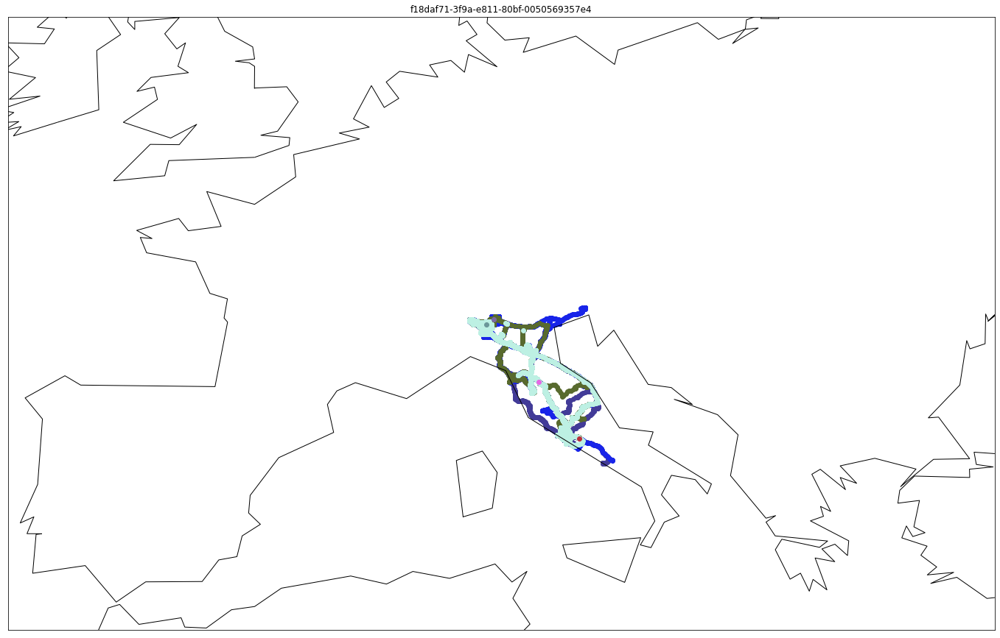

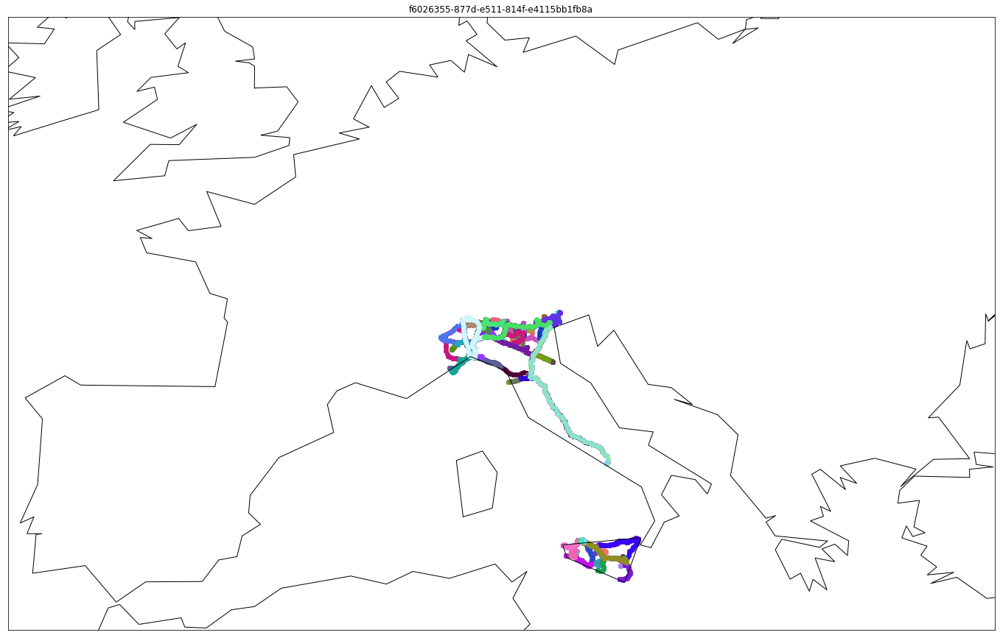

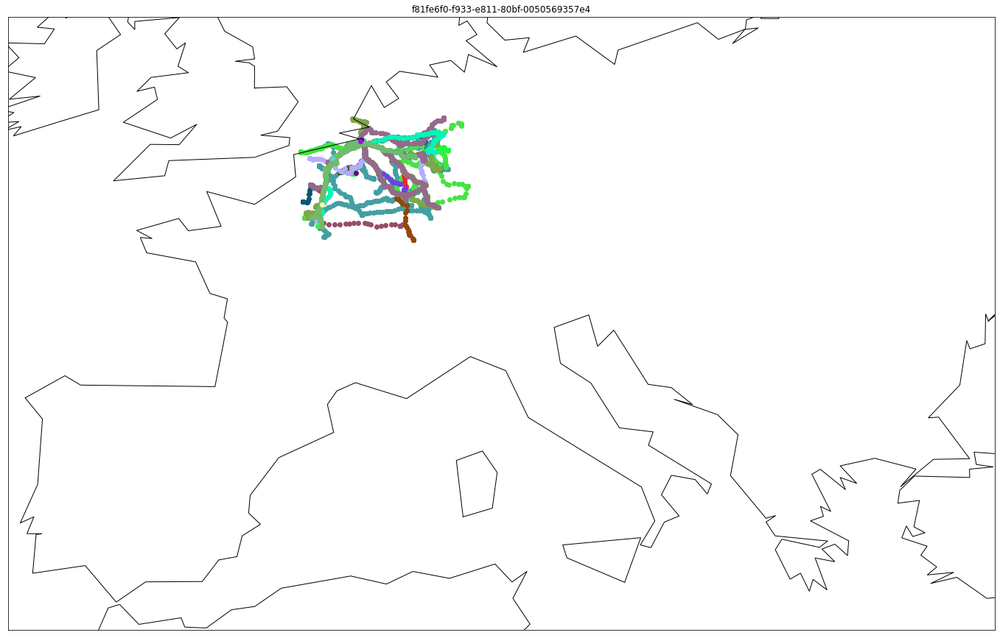

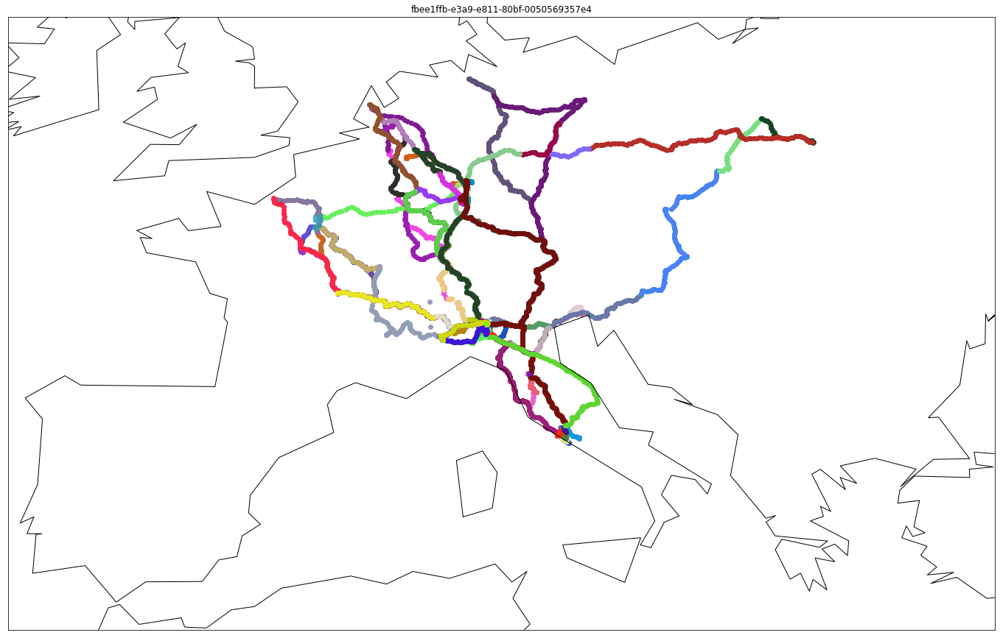

In [29]:
pdf = matplotlib.backends.backend_pdf.PdfPages("output.pdf")
for key in dfs.keys():
    fig = plt.figure(figsize=(24,24))
    plt.title(str(key))
    m = Basemap(projection="mill", llcrnrlat=35, urcrnrlat=55, llcrnrlon=-10, urcrnrlon=30, resolution="c")
    m.drawcoastlines()
    my_df = dfs[key]
    for i in range(len(my_df["Latitudine"])):
            for j in range(1,len(intervals[key])):
                if (my_df["DataOraAcquisizione"].iloc[i] <= intervals[key][j][0]) & (my_df["DataOraAcquisizione"].iloc[i] > intervals[key][j-1][0]):
                    scatter = m.scatter(my_df["Longitudine"].iloc[i], my_df["Latitudine"].iloc[i], latlon=True, label=f"{my_df['DataOraAcquisizione'].iloc[i]}", c=intervals[key][j][1])

    #mplcursors.cursor(hover=True)
    plt.show()
    pdf.savefig(fig)
pdf.close()

fig = plt.figure(figsize=(24,24))
m = Basemap(projection="mill", llcrnrlat=35, urcrnrlat=55, llcrnrlon=5, urcrnrlon=20, resolution="c")
m.drawcoastlines()
my_df = dfs[my_mezzo]
for i in range(len(my_df["Latitudine"])):
    if i % 5 == 0:
        for j in range(1,len(interval_list)):
            if (my_df["DataOraAcquisizione"].iloc[i] <= interval_list[j][0]) & (my_df["DataOraAcquisizione"].iloc[i] > interval_list[j-1][0]):
                scatter = m.scatter(my_df["Longitudine"].iloc[i], my_df["Latitudine"].iloc[i], latlon=True, label=f"{my_df['DataOraAcquisizione'].iloc[i]}", c=interval_list[j][1])
            
#mplcursors.cursor(hover=True)
plt.show()

for el in dfs.keys():
    fig = plt.figure(figsize=(24,24))
    m = Basemap(projection="mill", llcrnrlat=35, urcrnrlat=55, llcrnrlon=5, urcrnrlon=20, resolution="c")
    m.drawcoastlines()
    my_df = dfs[el]
    for i in range(len(my_df["Latitudine"])):
        scatter = m.scatter(my_df["Longitudine"].iloc[i], my_df["Latitudine"].iloc[i], latlon=True, label=f"{my_df['DataOraAcquisizione'].iloc[i]}")
    #labels = new_df["City"]
    #tooltip = mpld3.plugins.PointLabelTooltip(scatter, labels=labels)
    #mpld3.plugins.connect(fig, tooltip)
    #lines = new_df["City"]
    #mplcursors.cursor(hover=True)
    #mpld3.show()
    plt.show()

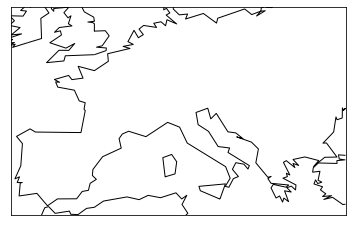

In [28]:
m = Basemap(projection="mill", llcrnrlat=35, urcrnrlat=55, llcrnrlon=-10, urcrnrlon=30, resolution="c")
m.drawcoastlines()